#### Goal: For this Episode of the Series, your task is to use a multi-class approach to predict the the outcomes of patients with cirrhosis. Good viewing !

**OBJECTIVES:**
- Better understand our data (a small step forward is better than a big step back)
- Develop an initial modeling strategy

Basic checklist

**SHAPE ANALYSIS:**

- target variable: Status
- rows and columns: train (7905, 20) test (5271, 19)
- variable types: 9 float64, 7 object, 4 int64
- Missing values analysis : NONE


**ANALYSE DE FOND:**

- the training dataset; Status is the categorical target; C (censored) indicates the patient was alive at N_Days,
  CL indicates the patient was alive at N_Days due to liver a transplant, and D indicates the patient was deceased at N_Days.
- Target visualization: target class unbalanced: 62.8% C / 33.7% D / 3.5% CL
- Status (Label): approximately 50% of patients treated with placebo and 50% of patients treated with D-penicillamine

***Significance of variables:***

qualitative
- SEX: the majority of test participants were women (92.8%)
- Hepatomegaly: around 50% of patients had an increase in liver volume
- Ascites: accumulation of protein-containing fluid in the abdomen (NO 95%)
- Spiders: a "spider angioma" is a small skin lesion characterized by a central point surrounded by dilated blood vessels,
giving the appearance of spider legs. It can be associated with a variety of medical conditions, including liver disease.(75.5 % NO)
- Edema: (NO 91% / Yes 4%, S 5% ????) No information on the significance of the 'S' - please contact the person initiating the data collection for more information.

distribution continuous variables
- some follow a normal distribution others do not, some are standardized others are not

***Relationship Variables / Target:***

distribution of continuous variables 'biological metrics' vs target
- Bilirubin : There seems to be a link between low Bilirubin levels and the probability of surviving without needing a transplant.
- Cholesterol: It seems that patients with high cholesterol levels are more likely to need a transplant or to die during the experiment.
- Copper: There appears to be a relationship between low copper levels in the blood and the likelihood of needing a transplant or dying during the experiment.
- Alk_phos: There appears to be a relationship between patients with high levels of alk_phos and the probability of dying or needing a transplant during the experiment.
- SGOT: (no clinical sginification according to personal research)

Age vs Target
- It would appear that 25 - 35 year-olds tend to die less than other categories (representing 7.39% of patients and only 3.75% of deaths after N_days).
- It would appear that 65 - 75 year olds tend to die more than other categories (representing 5.81% of patients and over 9.8% of deaths after N_days)
- 35 - 45 year-olds appear to be more likely to undergo transplantation than other age groups.

Sex vs. Target
- It would appear that women die less than men during the experiment (representing 92.8% of patients but only 88% of deaths after N_days)

Drug vs. Target relationship
- It seems that patients receiving D-penicillamine are more likely to receive a transplant than others

Relationship between categorical variables and Target
- Ascites : It would appear that the majority of people who survived the experiment did not have ascites.
- Hepatomegaly : It would appear that the majority of deaths during the experiment involved people who had ehpatomegaly.
- Edema : There would appear to be a link between people who died during the experiment and having edema.

**MORE DETAILED ANALYSIS:**

***Relationship Variables / Variables:***

Biological metrics vs biological metrics
- The most explicit correlations concern almost all the Bilirubin (bilirubin / copper 0.44) (bilirubin / SGOT 0.37) (bilirubin / cholesterol 0.3)
- there is no significant correlation between biological metrics

Biological metrics vs age_quantile
- The highest correlation coefficients reached a maximum of 0.13, which is very low. The correlation between patient age and biological metrics is very weak.

N_Days Vs Biological Metrics
- No real correlation

### **IMPORT USUAL LIBRAIRIES**

In [1]:
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind

import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import warnings
warnings.filterwarnings("ignore", category=FutureWarning) # manage warning messages

import os
os.getcwd()  # Get current working directory
os.chdir(r"C:\Users\33760\Desktop\concours_kaggle\notebook")  # Set working directory

c:\Users\33760\anaconda3\envs\myenv\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


### **IMPORT DATASET**

In [2]:
df_test = pd.read_csv(r'C:\Users\33760\Desktop\concours_kaggle\playground-series-s3e26\test.csv')
df_train = pd.read_csv(r'C:\Users\33760\Desktop\concours_kaggle\playground-series-s3e26\train.csv')

In [3]:
# Create a copy
df_train_copy = df_train.copy()
df_test_copy = df_test.copy()

### **DISCOVER THE DATASET**

In [4]:
df_train.shape
(f'The dataset df_train contains {df_train.shape[0]} rows and {df_train.shape[1]} columns')

'The dataset df_train contains 7905 rows and 20 columns'

In [5]:
df_test.shape
(f'The dataset df_test contains {df_test.shape[0]} rows and {df_test.shape[1]} columns')

'The dataset df_test contains 5271 rows and 19 columns'

In [6]:
# Display df_train
df_train.head()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
0,0,999,D-penicillamine,21532,M,N,N,N,N,2.3,316.0,3.35,172.0,1601.0,179.80,63.0,394.0,9.7,3.0,D
1,1,2574,Placebo,19237,F,N,N,N,N,0.9,364.0,3.54,63.0,1440.0,134.85,88.0,361.0,11.0,3.0,C
2,2,3428,Placebo,13727,F,N,Y,Y,Y,3.3,299.0,3.55,131.0,1029.0,119.35,50.0,199.0,11.7,4.0,D
3,3,2576,Placebo,18460,F,N,N,N,N,0.6,256.0,3.50,58.0,1653.0,71.30,96.0,269.0,10.7,3.0,C
4,4,788,Placebo,16658,F,N,Y,N,N,1.1,346.0,3.65,63.0,1181.0,125.55,96.0,298.0,10.6,4.0,C


In [7]:
#Display df_test
df_test.head()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,7905,3839,D-penicillamine,19724,F,N,Y,N,N,1.2,546.0,3.37,65.0,1636.0,151.90,90.0,430.0,10.6,2.0
1,7906,2468,D-penicillamine,14975,F,N,N,N,N,1.1,660.0,4.22,94.0,1257.0,151.90,155.0,227.0,10.0,2.0
2,7907,51,Placebo,13149,F,N,Y,N,Y,2.0,151.0,2.96,46.0,961.0,69.75,101.0,213.0,13.0,4.0
3,7908,2330,D-penicillamine,20510,F,N,N,N,N,0.6,293.0,3.85,40.0,554.0,125.55,56.0,270.0,10.6,2.0
4,7909,1615,D-penicillamine,21904,F,N,Y,N,N,1.4,277.0,2.97,121.0,1110.0,125.00,126.0,221.0,9.8,1.0


In [8]:
df_train.describe(include = 'all') # Display all columns

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
count,7905.000000,7905.000000,7905,7905.000000,7905,7905,7905,7905,7905,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905
unique,NaN,NaN,2,NaN,2,2,2,2,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
top,NaN,NaN,Placebo,NaN,F,N,Y,N,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C
freq,NaN,NaN,4010,NaN,7336,7525,4042,5966,7161,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4965
mean,3952.000000,2030.173308,NaN,18373.146490,NaN,NaN,NaN,NaN,NaN,2.594485,350.561923,3.548323,83.902846,1816.745250,114.604602,115.340164,265.228969,10.629462,3.032511,NaN
std,2282.121272,1094.233744,NaN,3679.958739,NaN,NaN,NaN,NaN,NaN,3.812960,195.379344,0.346171,75.899266,1903.750657,48.790945,52.530402,87.465579,0.781735,0.866511,NaN
min,0.000000,41.000000,NaN,9598.000000,NaN,NaN,NaN,NaN,NaN,0.300000,120.000000,1.960000,4.000000,289.000000,26.350000,33.000000,62.000000,9.000000,1.000000,NaN
25%,1976.000000,1230.000000,NaN,15574.000000,NaN,NaN,NaN,NaN,NaN,0.700000,248.000000,3.350000,39.000000,834.000000,75.950000,84.000000,211.000000,10.000000,2.000000,NaN
50%,3952.000000,1831.000000,NaN,18713.000000,NaN,NaN,NaN,NaN,NaN,1.100000,298.000000,3.580000,63.000000,1181.000000,108.500000,104.000000,265.000000,10.600000,3.000000,NaN
75%,5928.000000,2689.000000,NaN,20684.000000,NaN,NaN,NaN,NaN,NaN,3.000000,390.000000,3.770000,102.000000,1857.000000,137.950000,139.000000,316.000000,11.000000,4.000000,NaN


In [9]:
# See column headings
df_train.columns

Index(['id', 'N_Days', 'Drug', 'Age', 'Sex', 'Ascites', 'Hepatomegaly',
       'Spiders', 'Edema', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper',
       'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin',
       'Stage', 'Status'],
      dtype='object')

In [10]:
# Column type
df_train.dtypes

id                 int64
N_Days             int64
Drug              object
Age                int64
Sex               object
Ascites           object
Hepatomegaly      object
Spiders           object
Edema             object
Bilirubin        float64
Cholesterol      float64
Albumin          float64
Copper           float64
Alk_Phos         float64
SGOT             float64
Tryglicerides    float64
Platelets        float64
Prothrombin      float64
Stage            float64
Status            object
dtype: object

In [11]:
# Transform 'Stage' float to object
df_train['Stage'] = df_train['Stage'].astype('object')
df_test['Stage'] = df_test['Stage'].astype('object')

In [12]:
df_train.dtypes.value_counts()

float64    9
object     8
int64      3
dtype: int64

In [13]:
# Delete id column
from functions import drop_column
drop_column(df_train, 'id', df_name = 'df_train')
drop_column(df_test, 'id', df_name = 'df_test')
drop_column(df_train_copy, 'id', df_name = 'df_train_copy')

The 'id' column has been removed from df_train.
The 'id' column has been removed from df_test.
The 'id' column has been removed from df_train_copy.


#### **MISSING VALUES**

In [14]:
df_train.isnull().sum()

print('No missing values')

No missing values


In [15]:
from functions import plot_missing_heatmap

plot_missing_heatmap(df_train, df_name = 'df_train')
plot_missing_heatmap(df_test, df_name = 'df_test')

No missing values in df_train.
No missing values in df_test.


### **OUTLIERS / UNDERLIERS**

In [16]:
""" Only the sample points lying outside the whiskers are shown. If 'suspectedoutliers', 
all outlier points are shown and those less than 4*Q1-3*Q3 or greater than 4*Q3-3*Q1 are highlighted with the marker’s 'outliercolor'."""

# Liste des indices des colonnes à inclure dans la boucle
idx_columns_dispersion = [1, 3, 9, 10, 11, 12, 13, 14, 15, 16, 17]  # Remplacez ces indices par ceux que vous souhaitez inclure

# Boucle for pour créer des graphiques de dispersion pour les colonnes sélectionnées avec iloc
for col_idx in idx_columns_dispersion:
    col_title = df_train.columns[col_idx]
    fig = px.box(df_train, y=df_train.iloc[:, col_idx], title=f'Dispersion de {col_title}')
    fig.show()

### **LABEL ANALYSIS**

In [17]:
# Class label
df_train['Status'].unique()

array(['D', 'C', 'CL'], dtype=object)

In [18]:
df_train["Status"].value_counts()

C     4965
D     2665
CL     275
Name: Status, dtype: int64

In [19]:
# Display label distribution
fig = px.histogram(df_train, x = 'Status',
                   title = 'Label distribution analysis',
                   histnorm = 'percent',
                   text_auto = True)
fig.show()

The different classes are unbalanced (In order to analyse the algorithm results using metrics such as f1 score, recall and precision to avoid dummy models).

### **continuous variables distribution**

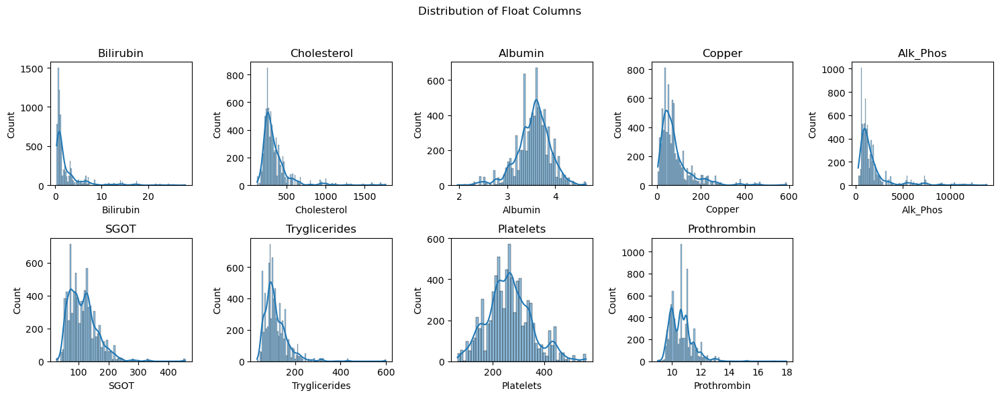

In [20]:
# Select only float columns
float_cols = df_train.select_dtypes('float').columns

# Set up the subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
fig.suptitle('Distribution of Float Columns')

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each column on a separate subplot with seaborn
for i, col in enumerate(float_cols):
    sns.histplot(df_train[col], kde=True, ax=axes[i])
    axes[i].set_title(col)
    
# Delete the last empty axis
fig.delaxes(axes[-1])

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

None of the biological metrics (float64) is centered in zero data (non-standardized), some of these variables follow a normal distribution.

### **Distribution variable 'Age'**

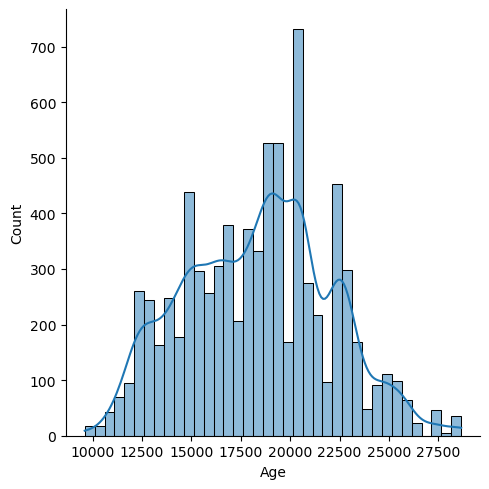

In [21]:
# Display graph with Seaborn
sns.displot(df_train['Age'], kde = True)

### **Categorical variables analysis**

In [22]:
# Display modalities of categorical variables 
for col in df_train.select_dtypes('object'):
    print(f'{col:-<20} {df_train[col].unique()}')

Drug---------------- ['D-penicillamine' 'Placebo']
Sex----------------- ['M' 'F']
Ascites------------- ['N' 'Y']
Hepatomegaly-------- ['N' 'Y']
Spiders------------- ['N' 'Y']
Edema--------------- ['N' 'Y' 'S']
Stage--------------- [3.0 4.0 2.0 1.0]
Status-------------- ['D' 'C' 'CL']


In [23]:
;# Display distribution of categorcal variables (pie chart)
for col in df_train.select_dtypes('object'):
    fig = px.pie(df_train.select_dtypes('object'), names = col, title = col)
    fig.show()

### **Dataset subset creation : alive / alive due to transplant / dead (At N_days)** ###

In [24]:
# Create a dataset with label C (alive)
df_alive = df_train[df_train['Status'] == 'C']
df_alive.head()

,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
1,2574,Placebo,19237,F,N,N,N,N,0.9,364.0,3.54,63.0,1440.0,134.85,88.0,361.0,11.0,3.0,C
3,2576,Placebo,18460,F,N,N,N,N,0.6,256.0,3.50,58.0,1653.0,71.30,96.0,269.0,10.7,3.0,C
4,788,Placebo,16658,F,N,Y,N,N,1.1,346.0,3.65,63.0,1181.0,125.55,96.0,298.0,10.6,4.0,C
6,1300,Placebo,17703,F,N,N,N,N,1.0,328.0,3.35,43.0,1677.0,137.95,90.0,291.0,9.8,3.0,C
7,1615,Placebo,21281,F,N,Y,N,N,0.6,273.0,3.94,36.0,598.0,52.70,214.0,227.0,9.9,3.0,C


In [25]:
# Create a dataset with label D (dead)
df_alive_transplant = df_train[df_train['Status'] == 'D']
df_alive_transplant.head()

,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
0,999,D-penicillamine,21532,M,N,N,N,N,2.3,316.0,3.35,172.0,1601.0,179.80,63.0,394.0,9.7,3.0,D
2,3428,Placebo,13727,F,N,Y,Y,Y,3.3,299.0,3.55,131.0,1029.0,119.35,50.0,199.0,11.7,4.0,D
5,703,D-penicillamine,19270,F,N,Y,N,N,0.6,227.0,3.46,34.0,6456.2,60.63,68.0,213.0,11.5,3.0,D
14,904,D-penicillamine,22388,F,N,Y,N,N,3.9,304.0,3.20,13.0,1440.0,153.45,169.0,156.0,10.0,3.0,D
21,326,D-penicillamine,18199,F,N,Y,Y,S,6.6,244.0,3.02,199.0,1819.0,170.50,91.0,132.0,12.1,4.0,D


In [26]:
# Create a dataset with label CL (alive transplant)
df_dead = df_train[df_train['Status'] == 'CL']
df_dead.head()

,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
88,737,Placebo,19693,F,N,Y,Y,N,3.6,348.0,3.80,121.0,979.0,120.9,146.0,142.0,11.1,4.0,CL
166,762,D-penicillamine,15056,F,N,Y,N,N,14.4,1712.0,3.65,89.0,3681.0,158.1,139.0,297.0,10.0,3.0,CL
203,837,D-penicillamine,15526,F,N,Y,N,N,3.2,296.0,3.03,77.0,2276.0,170.5,101.0,372.0,10.2,4.0,CL
218,1725,Placebo,16154,M,N,N,N,N,4.5,460.0,3.74,148.0,1472.0,108.5,118.0,172.0,10.2,4.0,CL
301,2452,Placebo,19060,M,N,Y,N,S,1.3,372.0,3.01,227.0,1716.0,167.4,135.0,248.0,12.0,4.0,CL


## **Relation Quantitative Variable / Target**

In [27]:
# Create a variable with biological metrics
variables_metric_test = df_train.select_dtypes('float').columns
variables_metric_test

Index(['Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT',
       'Tryglicerides', 'Platelets', 'Prothrombin'],
      dtype='object')

#### ***Relation biological metrics VS Target ('Status')***

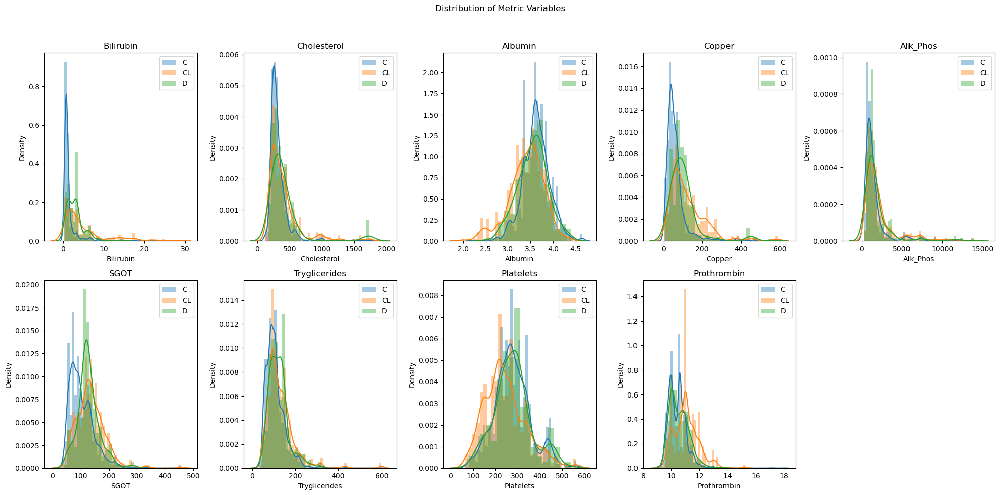

In [28]:
# Set up the subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))
fig.suptitle('Distribution of Metric Variables')

# Flatten the axes array for ease iterations
axes = axes.flatten()

for i, col in enumerate(variables_metric_test):
    sns.distplot(df_alive[col], label='C', ax = axes[i])
    sns.distplot(df_alive_transplant[col], label='CL', ax = axes[i])
    sns.distplot(df_dead[col], label='D', ax = axes[i])
    axes[i].set_title(col)
    axes[i].legend()
    
# Delete the last unused axis
fig.delaxes(axes[-1])
    
# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

**First observations :**

- Bilirubin : It would appear that the lower the level of bilirubin, the lower the chance of needing a transplant or dying during the experiment
  
- Cholesterol : It seems that patients with high cholesterol levels are more likely to need a transplant or die during the experiment
  
- Albumin : It seems that patients with low albumin levels are more likely to need a transplant during the experiment
  
- Copper : There seems to be a relationship between copper levels in the blood and the probability of receiving a transplant or dying during the experiment
  
- Alk_phos : There appears to be a relationship between patients with high levels of alk_phos and dying or needing a transplant during the experiment
  
- SGOT : (no clinical sginification according to personal research)

#### ***Relation Age VS Target ('Status')*** ####

In [29]:
# Create a new column 'Age_year'

# Days in a year (365.25 to account for leap years)
day_per_year = 365.25

# Apply 
df_train_copy['Age_year'] = (df_train_copy['Age'] / day_per_year).round(2)

# Display the DataFrame with 'Age_year' column
df_train_copy.head()

,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status,Age_year
0,999,D-penicillamine,21532,M,N,N,N,N,2.3,316.0,3.35,172.0,1601.0,179.80,63.0,394.0,9.7,3.0,D,58.95
1,2574,Placebo,19237,F,N,N,N,N,0.9,364.0,3.54,63.0,1440.0,134.85,88.0,361.0,11.0,3.0,C,52.67
2,3428,Placebo,13727,F,N,Y,Y,Y,3.3,299.0,3.55,131.0,1029.0,119.35,50.0,199.0,11.7,4.0,D,37.58
3,2576,Placebo,18460,F,N,N,N,N,0.6,256.0,3.50,58.0,1653.0,71.30,96.0,269.0,10.7,3.0,C,50.54
4,788,Placebo,16658,F,N,Y,N,N,1.1,346.0,3.65,63.0,1181.0,125.55,96.0,298.0,10.6,4.0,C,45.61


In [30]:
# Define age interval and corresponding categories
interval_year = [(25, 35), (35, 45), (45, 55), (55, 65), (65, 75), (75, float('inf'))]
categories = ['25 - 35', '35+ - 45', '45+ - 55', '55+ - 65', '65+ - 75', '75+ - 85']


# Create the new 'categorie_age' column
for interval, category in zip(interval_year, categories):
    mask = (df_train_copy['Age_year'] >= interval[0]) & (df_train_copy['Age_year'] < interval[1])
    df_train_copy.loc[mask, 'categorie_age'] = category
    
# Display dataframe
df_train_copy.head()

,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,...,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status,Age_year,categorie_age
0,999,D-penicillamine,21532,M,N,N,N,N,2.3,316.0,...,172.0,1601.0,179.80,63.0,394.0,9.7,3.0,D,58.95,55+ - 65
1,2574,Placebo,19237,F,N,N,N,N,0.9,364.0,...,63.0,1440.0,134.85,88.0,361.0,11.0,3.0,C,52.67,45+ - 55
2,3428,Placebo,13727,F,N,Y,Y,Y,3.3,299.0,...,131.0,1029.0,119.35,50.0,199.0,11.7,4.0,D,37.58,35+ - 45
3,2576,Placebo,18460,F,N,N,N,N,0.6,256.0,...,58.0,1653.0,71.30,96.0,269.0,10.7,3.0,C,50.54,45+ - 55
4,788,Placebo,16658,F,N,Y,N,N,1.1,346.0,...,63.0,1181.0,125.55,96.0,298.0,10.6,4.0,C,45.61,45+ - 55


In [31]:
# Display pie chart 'categorie_age' distribution
fig = px.pie(df_train_copy, names = 'categorie_age', title = "répartition des patients en fonction de 'categorie_age'")
fig.show()

In [32]:
# Display chart 'categorie_age' vs 'Status'
fig = px.histogram(df_train_copy, x = 'categorie_age',
                   facet_col = 'Status',
                   histnorm = 'probability',
                   color = 'Status',
                   title = "Patient Status after N_Days according to 'categorie_age'")
fig.show()

**Observations :**
- It would appear that 25 - 35 year olds tend to die less than other categories (representing 7.39% of patients and only 3.75% of deaths after N_days)
  
- It would appear that 65 - 75 year olds tend to die more than other categories (representing 5.81% of patients and over 9.8% of deaths after N_days)
  
- It would appear that 35-45 year olds have a better chance of being transplanted than other age groups

#### ***Relation Sex Vs Target***

In [33]:
# Display pie chart Age distribution with plotly.express
fig = px.pie(df_train_copy, names = 'Sex', title = "Sex distribution")
fig.show()

In [34]:
# Display histogram with plotly.express
fig = px.histogram(df_train, x = 'Sex',
                   facet_col = 'Status',
                   histnorm = 'probability density',
                   color = 'Status',
                   title = "Patient Status after N_Days according to Sex")
fig.show()

**first Observations :**

- It would appear that women die less than men during the experiment (representing 92.8% of patients but only 88% of deaths after N_days).

#### ***Relation Drug VS Target ('Status')***

In [35]:
# Dsisplay medication ddistribution
fig = px.pie(df_train, 
             names = 'Drug',
             title = "Drug distribution")
fig.show()

In [36]:
# Display histogram with plotly.express
fig = px.histogram(df_train, x = 'Drug', facet_col = 'Status',
                   histnorm = 'probability density',
                   title = "Patient 'Status' after N_days depending on medication",
                   color = 'Status')
fig.show()

**first observations :**

- It would appear that patients receiving D-penicillamine are more likely to receive a transplant than other patients.

#### ***Cross tab (categorical variables vs target)***

In [37]:
# Create a dataframe with all categorical variable
df_qualitative_var = df_train.select_dtypes('object')

# Remove the target variable from the dataframe
df_qualitative_var = df_qualitative_var.iloc[:,:-1].columns

# Display dataframe columns
df_qualitative_var

Index(['Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema', 'Stage'], dtype='object')

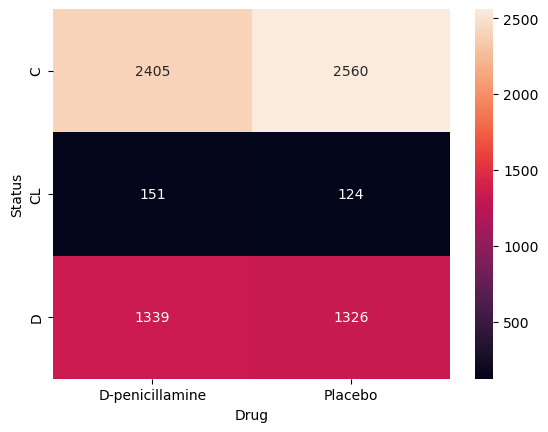

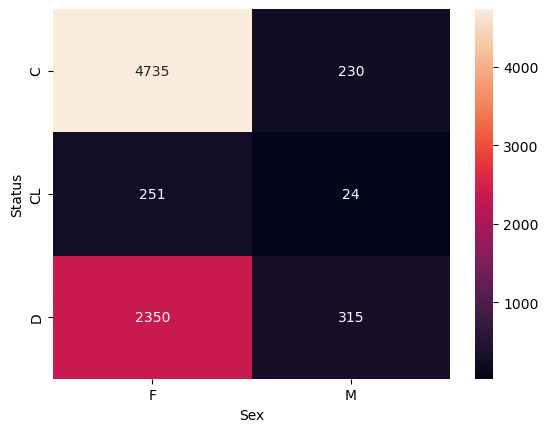

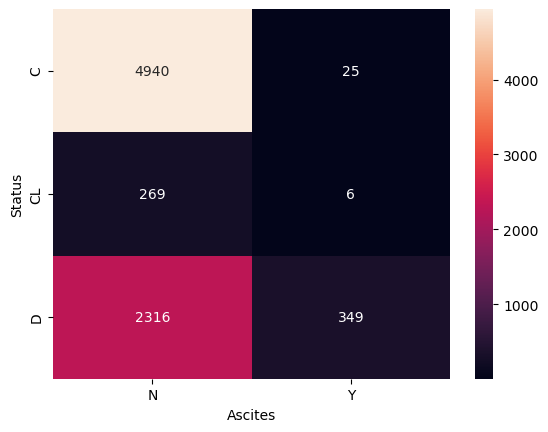

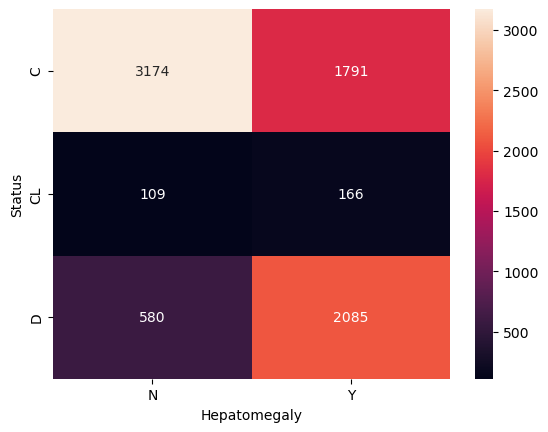

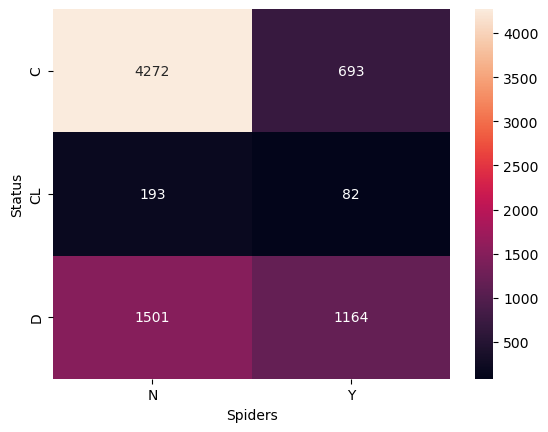

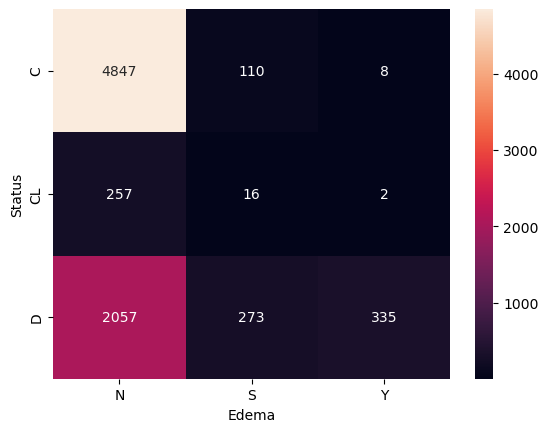

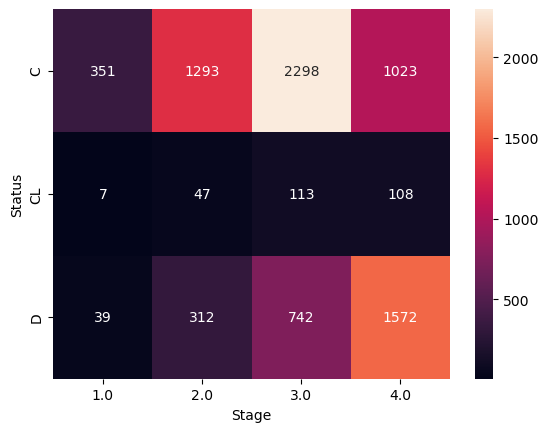

In [38]:
# Iterates through each categorical variable
for col in df_qualitative_var:
    plt.figure() # creates a new figure for each categorical variable
    sns.heatmap(pd.crosstab(df_train['Status'], df_train[col]), annot = True, fmt = 'd')

First observations :

- Ascites: It appears that the majority of individuals who survived during the experiment did not have ascites.

- Hepatomegaly: It seems that the majority of deaths during the experiment involved individuals who had hepatomegaly.

- Edema: It appears that the majority of individuals who died during the experiment had edema.

## **Relation Variable VS Variable**

#### ***bio metrics vs bio metrics***

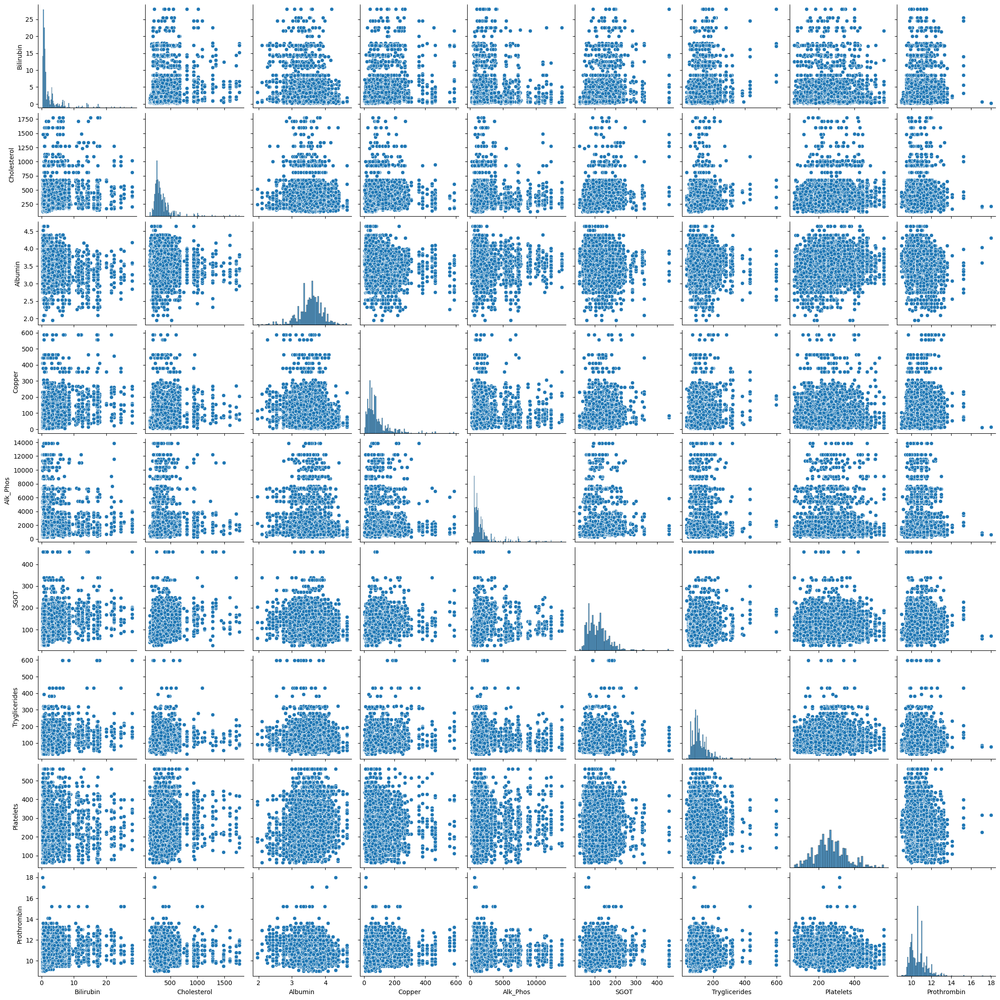

In [39]:
# Generates pairwise scatter plots for numerical variables
sns.pairplot(df_train[variables_metric_test])

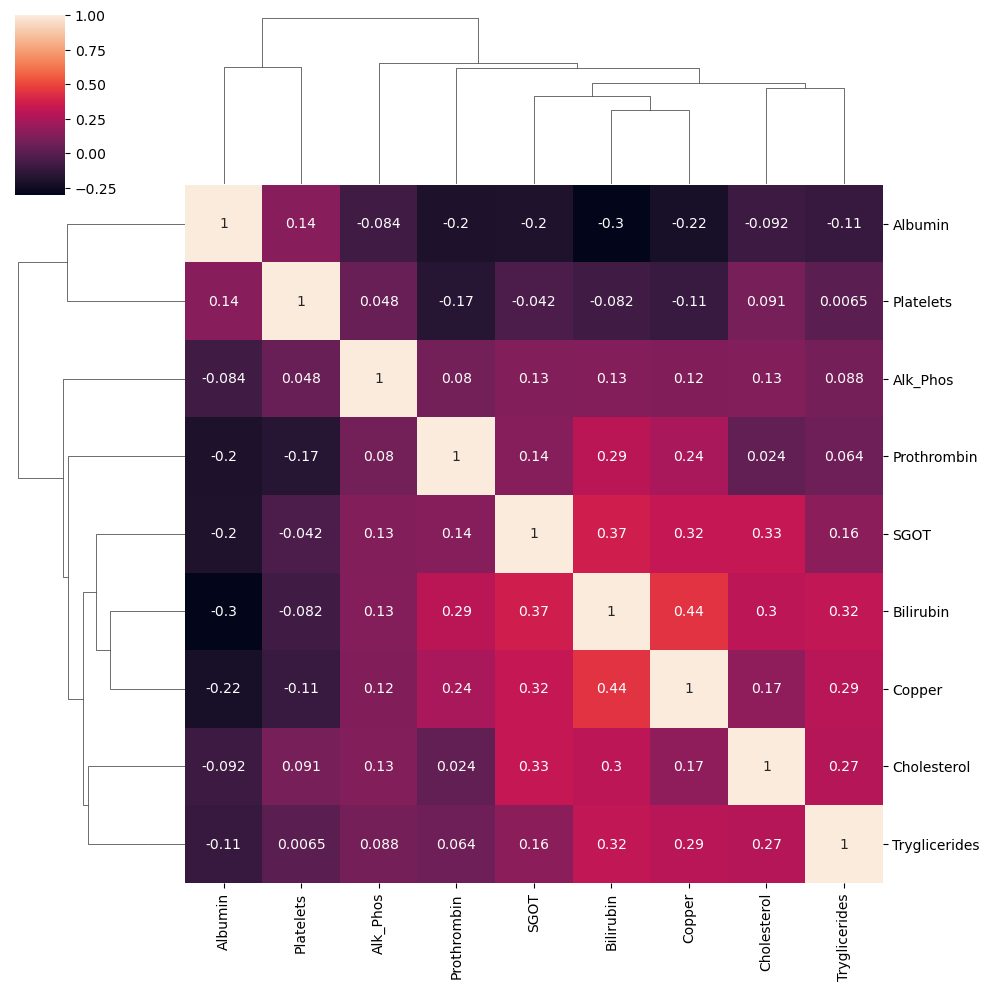

In [40]:
# Generate a clustered heatmap in order to distinguish relationship
sns.clustermap(df_train[variables_metric_test].corr(), annot = True)

Observation :

- The most explicit correlations concern almost all the bilirubin (bilirubin / copper 0.44) (bilirubin / SGOT 0.37) (bilirubin / cholesterol 0.3).

- There is no significant correlations between biological metrics

#### ***Relation Age Vs metrics biologiques***

In [41]:
# Create an nb_quantiles variable with the desired number of quantiles
nb_quantiles = 20

# Use qcut to discretise the 'Age_year' column into quantiles to create 'Age_quantile' (allow to ease vizualisation)
df_train_copy['Age_quantile'] = pd.qcut(df_train_copy['Age_year'], q= nb_quantiles, labels=False)

# Display the Dataframe
df_train_copy.head()

,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,...,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status,Age_year,categorie_age,Age_quantile
0,999,D-penicillamine,21532,M,N,N,N,N,2.3,316.0,...,1601.0,179.80,63.0,394.0,9.7,3.0,D,58.95,55+ - 65,15
1,2574,Placebo,19237,F,N,N,N,N,0.9,364.0,...,1440.0,134.85,88.0,361.0,11.0,3.0,C,52.67,45+ - 55,11
2,3428,Placebo,13727,F,N,Y,Y,Y,3.3,299.0,...,1029.0,119.35,50.0,199.0,11.7,4.0,D,37.58,35+ - 45,2
3,2576,Placebo,18460,F,N,N,N,N,0.6,256.0,...,1653.0,71.30,96.0,269.0,10.7,3.0,C,50.54,45+ - 55,9
4,788,Placebo,16658,F,N,Y,N,N,1.1,346.0,...,1181.0,125.55,96.0,298.0,10.6,4.0,C,45.61,45+ - 55,6


<Figure size 640x480 with 0 Axes>

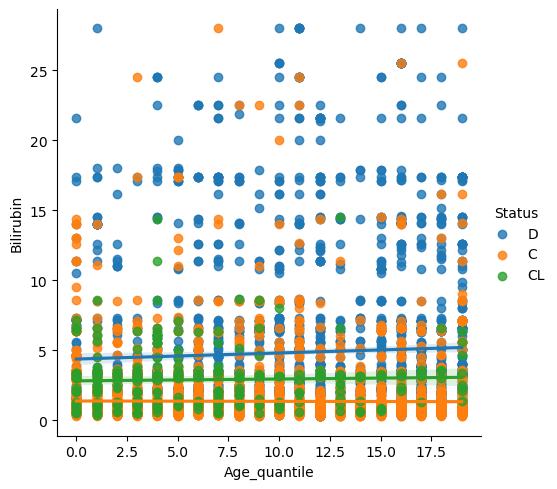

<Figure size 640x480 with 0 Axes>

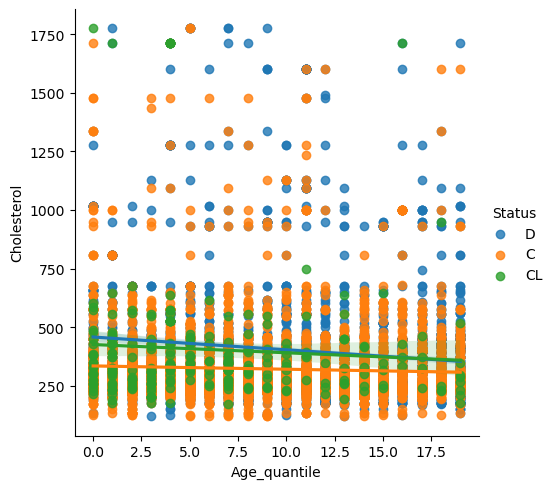

<Figure size 640x480 with 0 Axes>

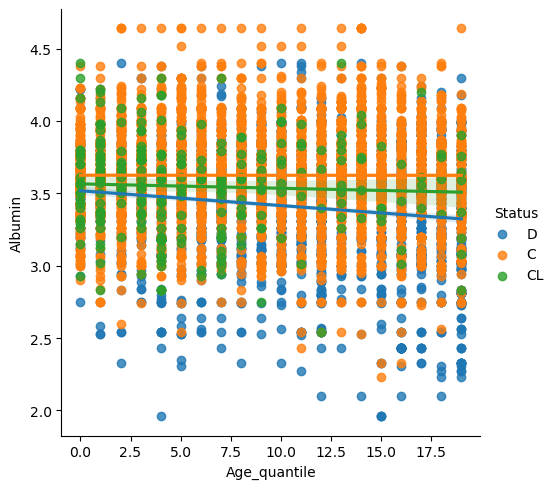

<Figure size 640x480 with 0 Axes>

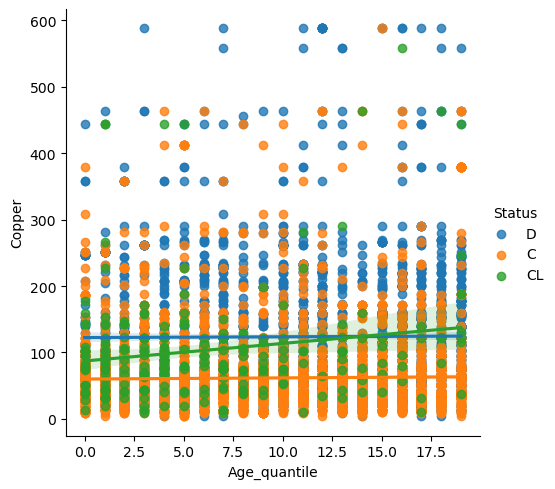

<Figure size 640x480 with 0 Axes>

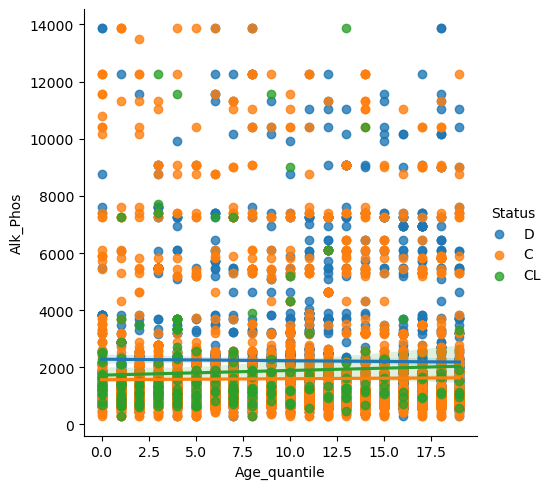

<Figure size 640x480 with 0 Axes>

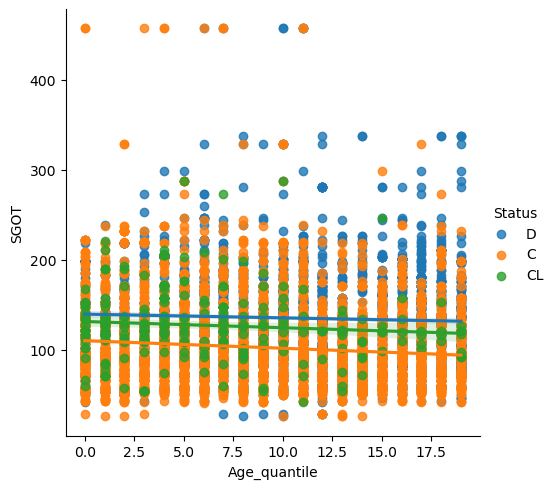

<Figure size 640x480 with 0 Axes>

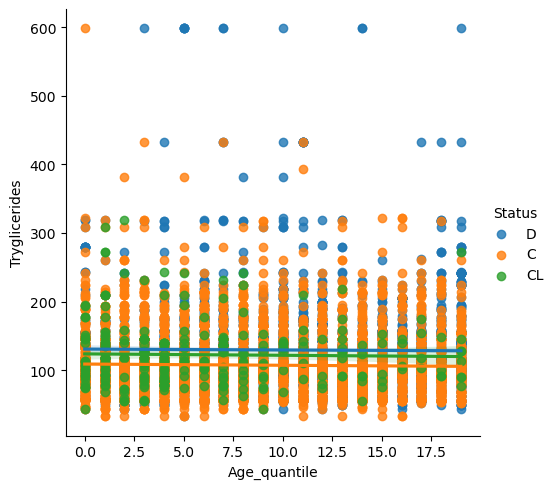

<Figure size 640x480 with 0 Axes>

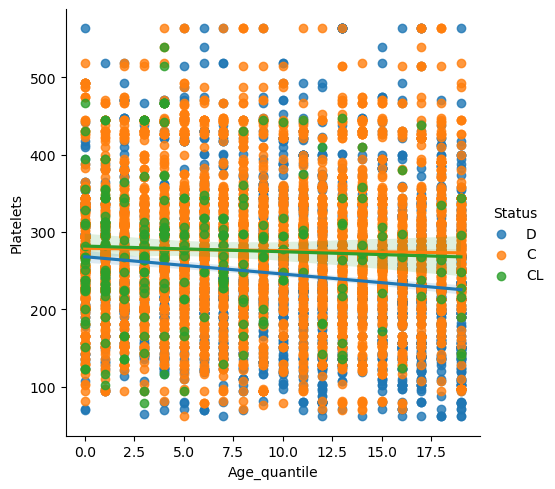

<Figure size 640x480 with 0 Axes>

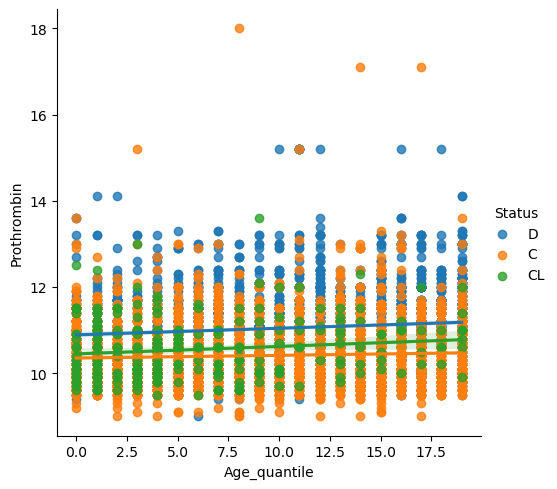

In [42]:
# linear regression analysis
for col in variables_metric_test:
    plt.figure()
    sns.lmplot(x = 'Age_quantile', y = col, hue = 'Status', data = df_train_copy)

In [43]:
df_train_copy.corr()['Age_quantile'].sort_values()

Albumin         -0.106333
N_Days          -0.098463
Platelets       -0.093334
Cholesterol     -0.052719
SGOT            -0.030520
Tryglicerides    0.014310
Alk_Phos         0.029881
Copper           0.077926
Bilirubin        0.091578
Stage            0.116847
Prothrombin      0.137456
Age              0.984976
Age_year         0.984978
Age_quantile     1.000000
Name: Age_quantile, dtype: float64

The highest correlation coefficients reached a maximum of 0.13, which is very low. The correlation between patient age, biological metrics and target is very weak.

### **Relation N_days / Bio metrics**

<Figure size 640x480 with 0 Axes>

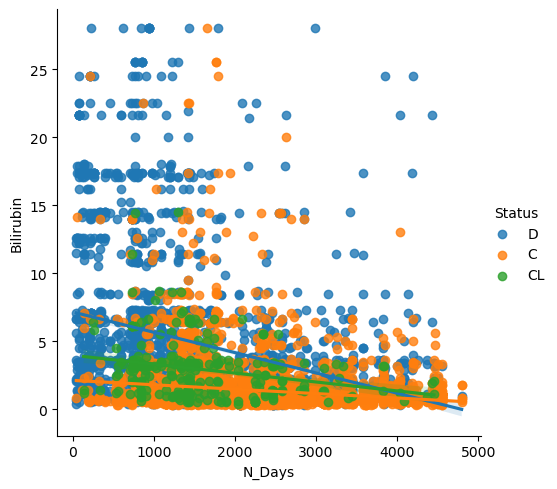

<Figure size 640x480 with 0 Axes>

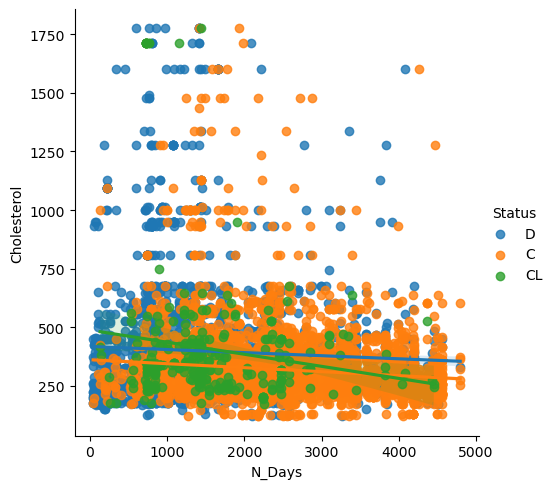

<Figure size 640x480 with 0 Axes>

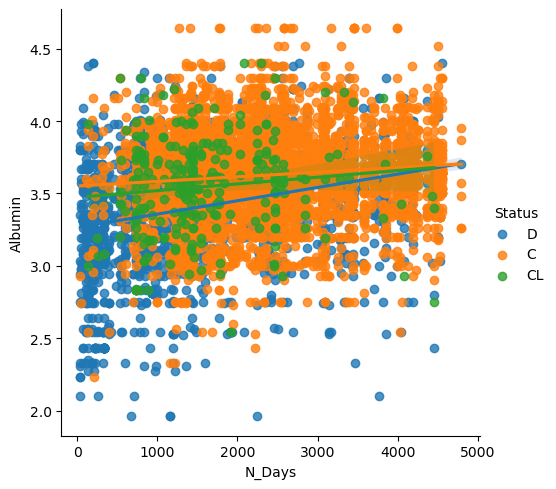

<Figure size 640x480 with 0 Axes>

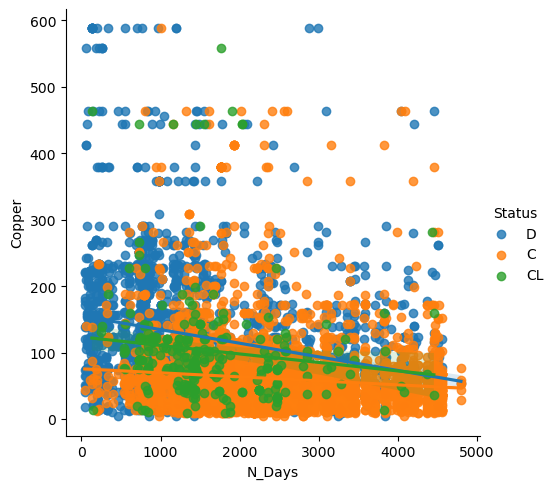

<Figure size 640x480 with 0 Axes>

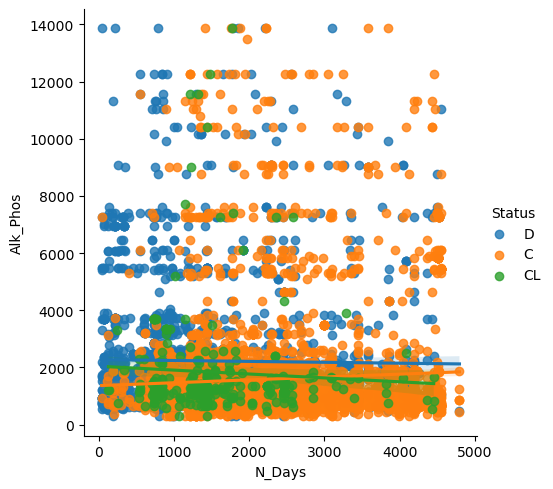

<Figure size 640x480 with 0 Axes>

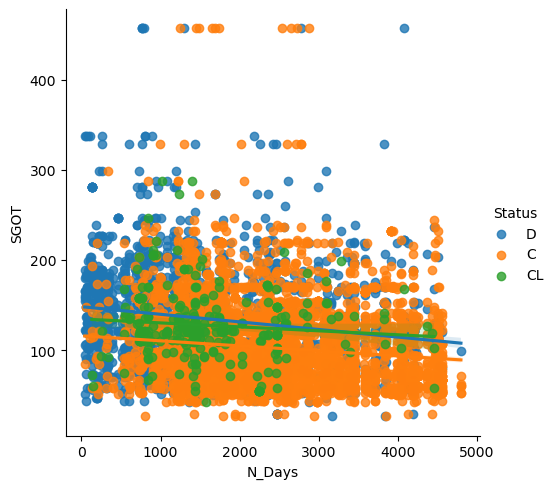

<Figure size 640x480 with 0 Axes>

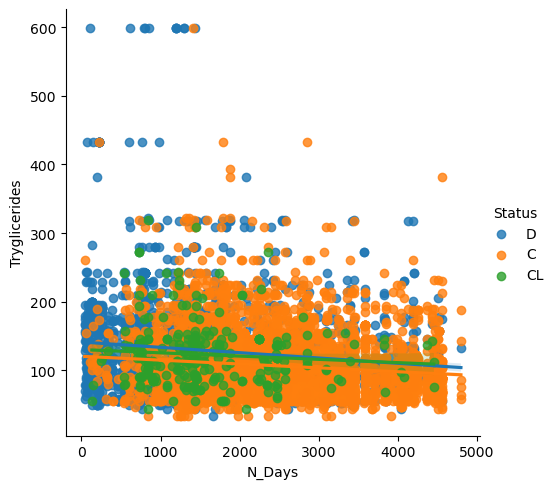

<Figure size 640x480 with 0 Axes>

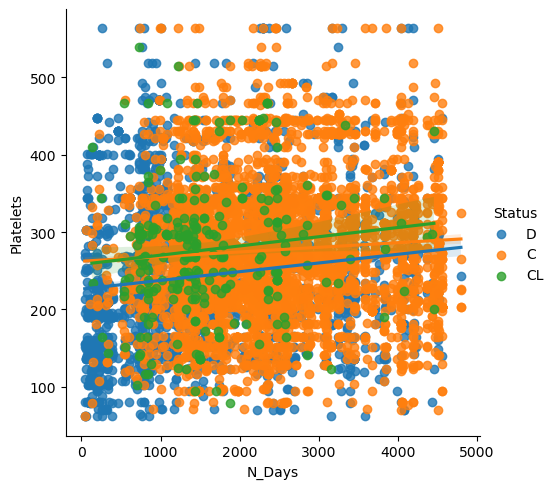

<Figure size 640x480 with 0 Axes>

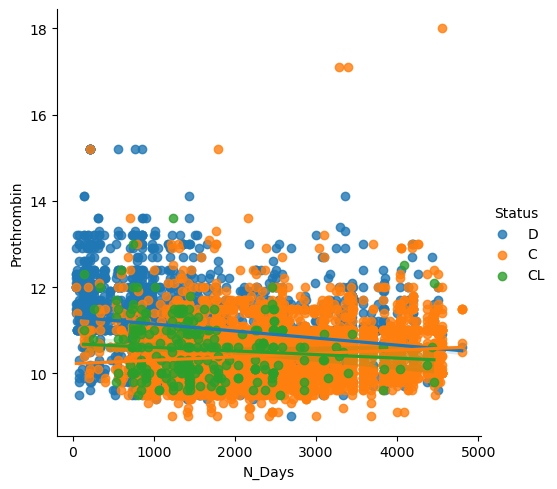

In [44]:
for col in variables_metric_test:
    plt.figure()
    sns.lmplot(x = 'N_Days', y = col, hue = 'Status', data = df_train_copy)

In [45]:
correlation_results = df_train_copy[variables_metric_test].corrwith(df_train_copy['N_Days']).sort_values()
print(correlation_results)

Bilirubin       -0.346434
Copper          -0.284355
SGOT            -0.240918
Tryglicerides   -0.186453
Prothrombin     -0.156032
Cholesterol     -0.145811
Alk_Phos        -0.030874
Platelets        0.147626
Albumin          0.255724
dtype: float64


#### **Drug  Vs Bio metrics**

In [46]:
# Create a dataset for each type of medication
placebo_df = df_train[df_train['Drug'] == 'Placebo']
d_penicillamine_df = df_train[df_train['Drug'] == 'D-penicillamine']

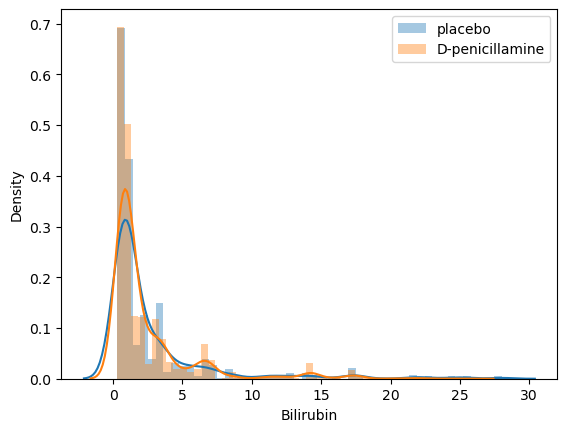

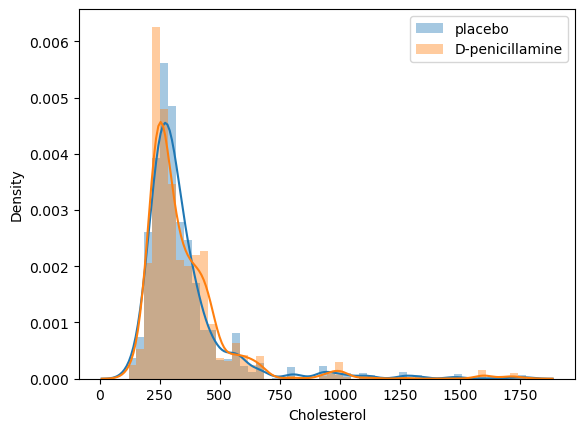

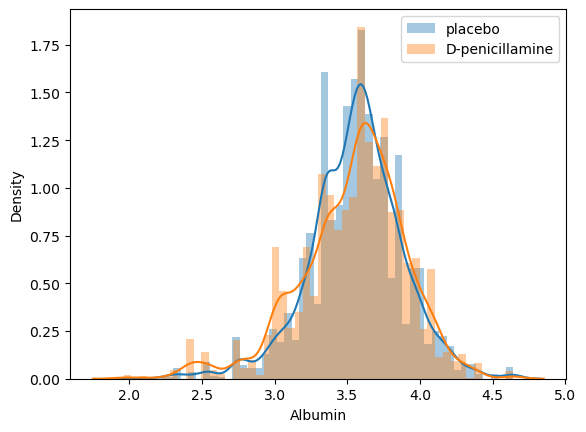

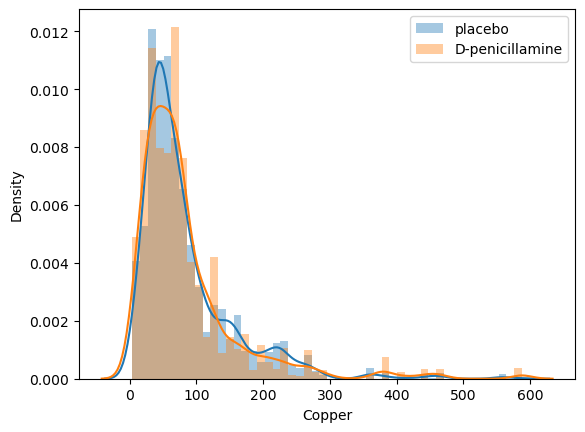

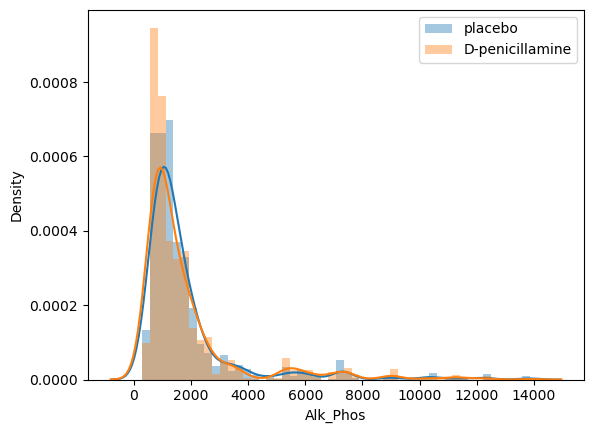

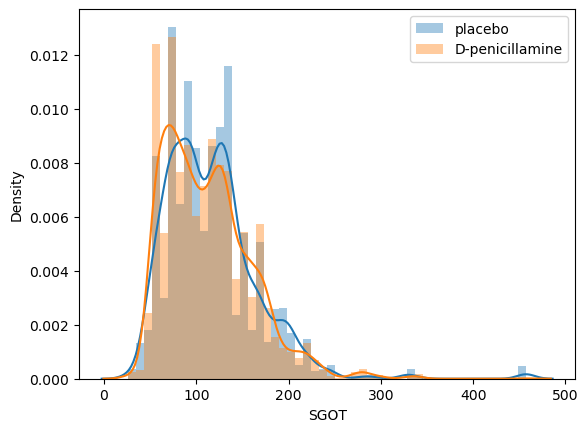

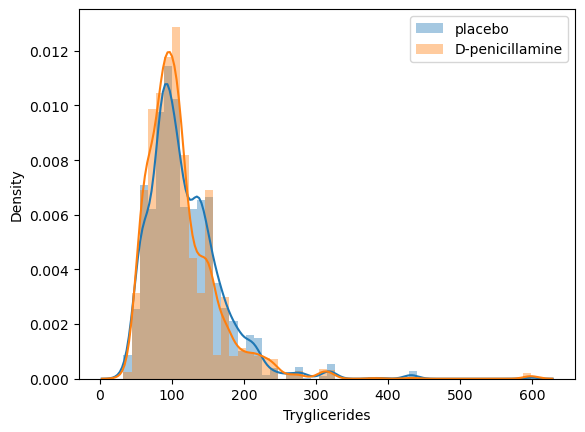

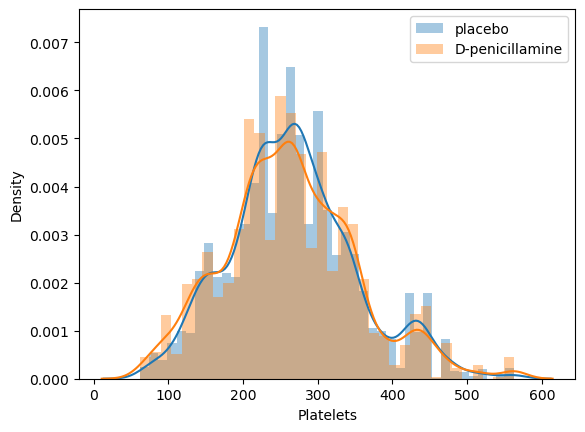

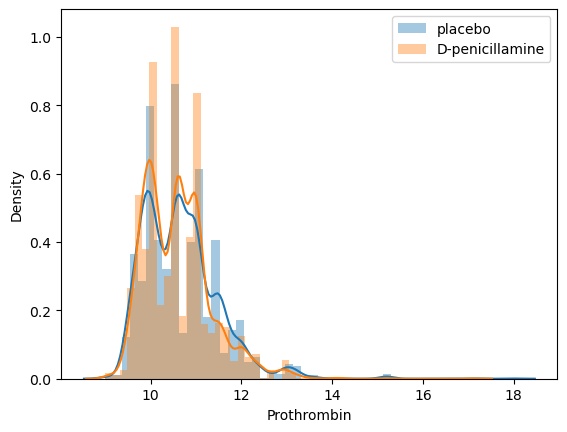

In [47]:
# Iterate over each column in the variables_metric_test
# Compare the distribution of data between 'placebo' and 'D-penicillamine' groups
for col in variables_metric_test:
    plt.figure()
    sns.distplot(placebo_df[col], label = 'placebo')
    sns.distplot(d_penicillamine_df[col], label = 'D-penicillamine')
    plt.legend()

#### ***Relation Stage Vs Bio metrics***

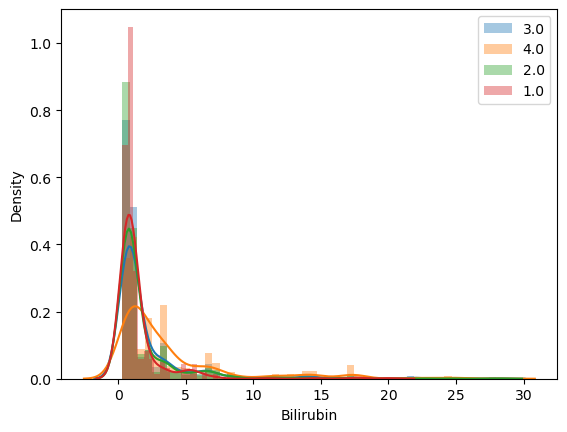

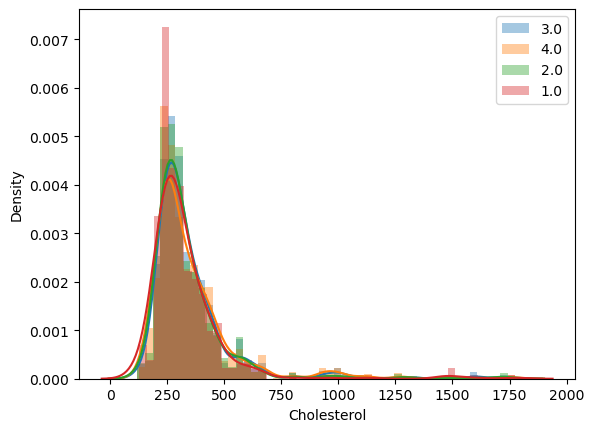

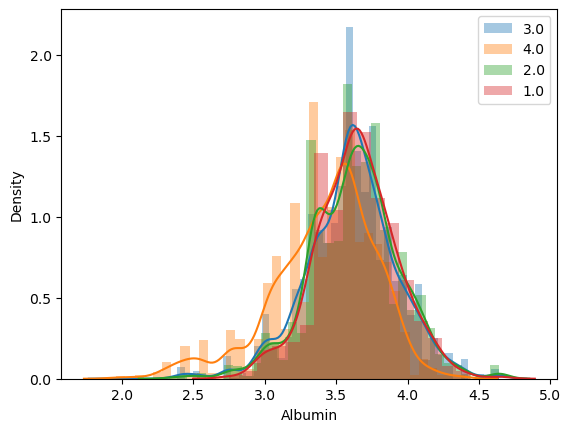

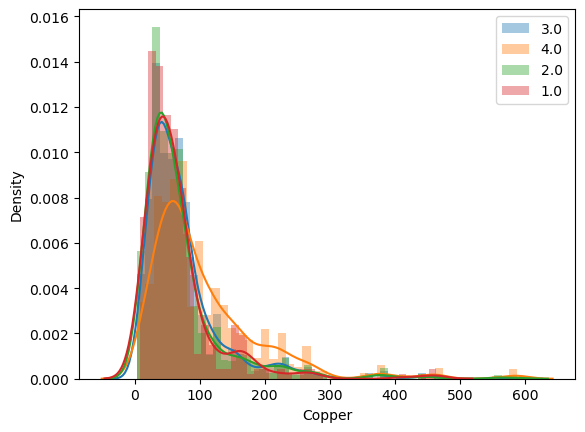

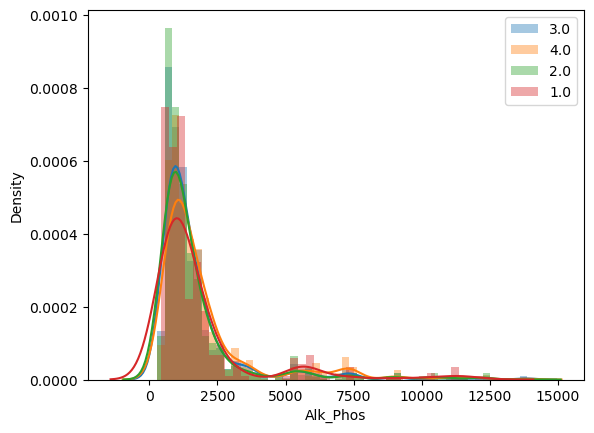

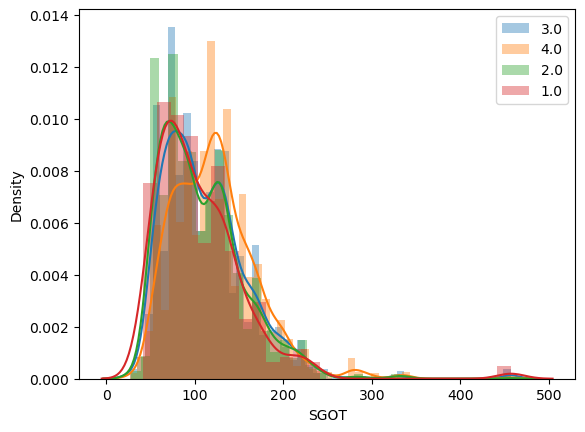

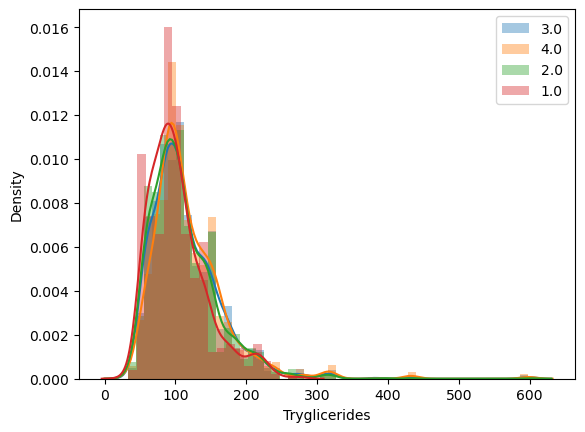

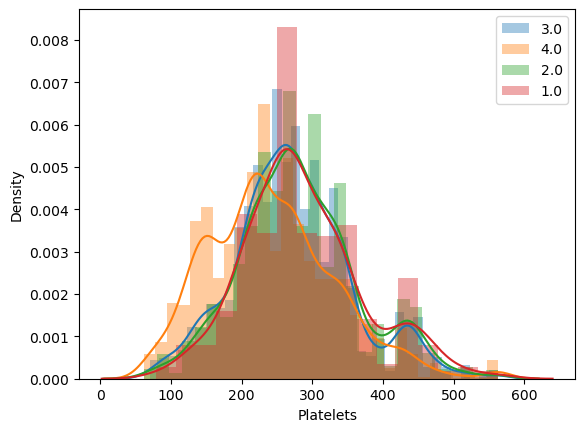

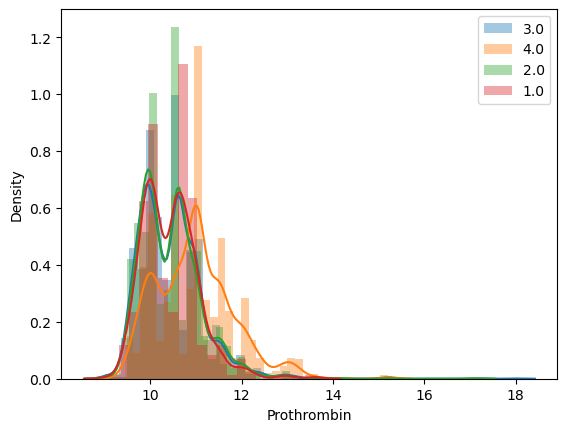

In [48]:
for col in variables_metric_test:
    plt.figure()
    for cat in df_train['Stage'].unique():
        sns.distplot(df_train[df_train['Stage']==cat][col], label = cat)
    plt.legend()

## ***Hypotheses to test :***

***age vs target***
- Il semblerait que les 25 - 35 ans ont tendance à moins mourir que les autres catégories (représente 7.39% des patients et seulement 3.75% des morts aprés N_days)

***Sex vs Target***
- Il semblerait que les femmes aient une chance de survie superieur à celle des hommes 


***metric bio vs Target***
- It would appear that 25-35 year olds tend to die less than other categories (representing 7.39% of patients and only 3.75% of deaths after N_days)
  
- It would appear that the average bilirubin level is lower in people who survive the experiment than in those who are grief-stricken or dead


***metric bio vs Drug***

- No clear pattern


***metric bio vs stage***

- It would appear that the mean levels of prothrombin, platelets, copper and bilirubin in stage 4 patients are different from those in less advanced stages

- It would appear that the average alk_phos levels differ according to the different stages

# STATISTICAL TESTS

### null hypotheses observations Age vs target

***H0 : There is not significant difference between the chance of survival of 25-35 year olds during the experiment and that of other age categories***

The chi2 test for independence is generally applicable when the data meet the following conditions:

- Data type : The data must be categorical

- Independence : Observations must be independent. This means that the fact that an individual belongs to an age category must not influence the fact that another individual belongs to an age category, and the same applies to the patient's final state. Make sure that each observation concerns only one patient.

- Sample size: The expected frequencies for each cell of the contingency table (the combinations of age categories and final states) must not be too small (at least 5)

- Categorical variable: Age should be treated as a categorical variable. If you have age intervals, make sure they are discrete and not continuous.

In [49]:
from scipy.stats import chi2_contingency

# Create a contingency table from the data
contingency_table = pd.crosstab(df_train_copy['categorie_age'] == '25 - 35', df_train_copy['Status'])

# Perform the chi2 test
chi2, p, _, _ = chi2_contingency(contingency_table, correction=False)  # correction=False (No Yates continuity correction)

# Display test results
print(f"Chi2 value: {chi2}")
print(f"P-value: {p}")

# choice of significant level
alpha = 0.05

# Compare p-value with significance level
if p < alpha:
    print("Null hypothesis rejected: There is a significant difference in the chance of survival")
else:
    print("Null hypothesis not rejected: No statistical evidence of a significant difference in the chance of survival")


Chi2 value: 89.61377202543144
P-value: 3.472295307432359e-20
Null hypothesis rejected: There is a significant difference in the chance of survival


### Null hypotheses observations Age vs target

***H0 : The probability of survival for women is less than or equal to the probability of survival for men***

The right-sided z test for two independent proportions (proportions_ztest) is used to compare the proportions of successes in two independent samples. Here are the underlying conditions for the application of this test:

- Independence: The observations in each group must be independent of each other. This means that the survival or otherwise of an individual in one group must not be linked to the survival of another individual.

- Random samples: The samples for each group must be randomly selected from the underlying population.

- Sufficient number of successes and failures: Each group must have a sufficient number of successes (in your case, 'C' for Survived) and failures for the z-test to be valid. In general, it is recommended that the number of events in each group be at least 5.

- Constant proportion values: The proportions of successes in each group should not be equal. It is also recommended to avoid cases where the proportions are close to 0 or 1.

In [50]:
from statsmodels.stats.proportion import proportions_ztest

# Separate the data for men and women
data_men = df_train_copy[df_train_copy['Sex'] == 'M']
data_women = df_train_copy[df_train_copy['Sex'] == 'F']

# Count the number of survivors (C) in each group
count_men = data_men[data_men['Status'] == 'D'].shape[0]
count_women = data_women[data_women['Status'] == 'D'].shape[0]

# Count the total number of individuals in each group
nobs_men = data_men.shape[0]
nobs_women = data_women.shape[0]

# Perform the one-sided right-tailed z-test for two independent proportions
stat, p_value = proportions_ztest([count_men, count_women], [nobs_men, nobs_women], alternative='larger')

# Display the test results
print(f"Z-test statistic: {stat}")
print(f"P-value of the z-test: {p_value}")

# Interpretation
alpha = 0.05
if p_value < alpha:
    print("Women, on average, have a higher survival rate than men.")
else:
    print("There is no statistical evidence that women have a higher survival rate than men.")

Z-test statistic: 11.338917675231398
P-value of the z-test: 4.208954656506119e-30
Women, on average, have a higher survival rate than men.


Warning ! : This result should be treated with caution. The random sample condition is not respected, since this is a clinical study of people with cyrhosis. In addition, we have no information about how patients were approached to take part in the experiment.

### hypothèses nulles metric bio vs Target

***H0 : The mean Bilirubin level for individuals with label C is less than or equal to the mean for patients with labels CL or D (comparison of multiple means, bivariate test, one-sided)***

normality and homogeneity of variances tests are inconclusive
use non-parametric Mann-Whitney U test

application conditions : 

- Independence of observations : The observations in each group must be independent of each other.

- Order scale: The data must be measured on an order scale. This means that you can classify the observations according to the variable you are measuring (in this case, the Bilirubin level).

- Similar distribution: The two groups being compared must have similar distribution patterns.

- Independent groups: Observations in one group must not be linked to those in the other group.

In [51]:
from scipy.stats import mannwhitneyu

# Replace 'Bilirubin' with the name of your column
data_C = df_train[df_train['Status'] == 'C']['Bilirubin']
data_CL = df_train[df_train['Status'] == 'CL']['Bilirubin']
data_D = df_train[df_train['Status'] == 'D']['Bilirubin']

# Comparison C vs CL
statistic_C_CL, p_value_C_CL = mannwhitneyu(data_C, data_CL, alternative='less')

# Comparison C vs D
statistic_C_D, p_value_C_D = mannwhitneyu(data_C, data_D, alternative='less')

# Display the results
print(f"Comparison C vs CL:")
print(f"Test Statistic: {statistic_C_CL}")
print(f"P-value: {p_value_C_CL}")

print(f"\nComparison C vs D:")
print(f"Test Statistic: {statistic_C_D}")
print(f"P-value: {p_value_C_D}")

# Interpretation
alpha = 0.05
if p_value_C_CL < alpha:
    print("The Bilirubin level for patients with label C is significantly lower than in those with label CL.")
else:
    print("No significant difference for Bilirubin levels between labels C and CL.")

if p_value_C_D < alpha:
    print("The Bilirubin level for patients with label C is significantly lower than in those with label D.")
else:
    print("No significant difference for Bilirubin levels between labels C and D.")



Comparison C vs CL:
Test Statistic: 264888.5
P-value: 1.932073247393017e-66

Comparison C vs D:
Test Statistic: 2316859.5
P-value: 0.0
The Bilirubin level for patients with label C is significantly lower than in those with label CL.
The Bilirubin level for patients with label C is significantly lower than in those with label D.


### hypothèses nulles observations metric bio vs stage

ANOVA (Analysis of Variance) is a statistical technique used to compare the means of three or more groups. Here are the conditions for applying ANOVA:

- Independent samples: The observations in each group must be independent of each other. This means that the value of an observation in one group must not be influenced by the value of an observation in another group. ok

- Normality: The distributions of the variables in each group must be approximately normal. ok

- Homogeneity of variances (homoscedasticity): The variances of the groups must be approximately equal. This means that the dispersion of the data in each group should be similar. You can check this by performing a Levene's test or by examining the residuals graphically.

- Variables measured on an interval or ratio scale: ANOVA is generally used with continuous variables measured on an interval or ratio scale. ok

- Equidistance of levels: The levels of the independent variable must be equidistant. For example, if you measure temperature in degrees Celsius, the difference between 10 and 20 degrees must be the same as between 20 and 30 degrees.

- Homogeneity of groups: The groups being compared must be homogeneous in terms of characteristics other those being studied. if the group signicantly on other variables, this may affect the interpretation of the results

#### ***H0: the mean levels of "Alk_Phos", "Prothrombin", "Platelets", "Copper" and "Bilirubin" do not differ according to the stage of the disease***. ####

In [55]:
from functions import perform_anova
from scipy.stats import f_oneway, levene

# Apply the function to different columns
metric_columns = ["Alk_Phos", "Prothrombin", "Platelets", "Copper", "Bilirubin"]
for metric_column in metric_columns:
    perform_anova(df_train, metric_column, "Stage")


Test de Levene pour l'homogénéité des variances :
Statistique de test : 2.23342094633685
P-valeur : 0.08252714941762414

Pour la colonne Alk_Phos:
Statistique de test F : 2.8688897461762686
P-valeur : 0.03533178406270941
La p-valeur de l'ANOVA est inférieure à 0.05 => On rejette l'hypothèse nulle.
  Multiple Comparison of Means - Tukey HSD, FWER=0.05   
group1 group2  meandiff p-adj    lower    upper   reject
--------------------------------------------------------
   1.0    2.0 -121.7235 0.6602 -394.3574 150.9103  False
   1.0    3.0  -80.7286 0.8551 -340.4849 179.0276  False
   1.0    4.0  223.2053 0.1267  -38.9578 485.3685  False
   2.0    3.0   40.9949 0.8928 -107.1507 189.1405  False
   2.0    4.0  344.9289    0.0  192.6025 497.2553   True
   3.0    4.0   303.934    0.0   176.077  431.791   True
--------------------------------------------------------

Test de Levene pour l'homogénéité des variances :
Statistique de test : 8.9674512756139
P-valeur : 6.85446708720981e-06
Le test d